## **LAB 2 Speech Recognition** (Saturday, 26/09/2026)

In [1]:
from IPython.display import Audio, display
from google.colab import files

# 1. Munculkan tombol upload
print("Silakan pilih file .wav Anda:")
uploaded = files.upload()

# 2. Ambil nama file yang berhasil diunggah
wav_filename = list(uploaded.keys())[0]
print(f"File berhasil diunggah: {wav_filename}")

# 3. Putar audio langsung
display(Audio(filename=wav_filename))

Silakan pilih file .wav Anda:


Saving sample.wav to sample.wav
Saving sample_audio.wav to sample_audio.wav
File berhasil diunggah: sample.wav


In [4]:
SAMPLE_WAV_PATH = "dataset-dian/sample.wav"

In [5]:
# 1. IPython
from IPython.display import Audio, display

display(Audio(SAMPLE_WAV_PATH))

# **Soundfile**

In [6]:
# 2. Soundfile
import soundfile as sf

# Read
audio, sample_rate = sf.read(SAMPLE_WAV_PATH)
print(audio, sample_rate)

[[-3.05175781e-05  0.00000000e+00]
 [ 9.15527344e-05  0.00000000e+00]
 [-1.52587891e-04  0.00000000e+00]
 ...
 [-6.10351562e-05  6.10351562e-05]
 [ 0.00000000e+00 -6.10351562e-05]
 [ 6.10351562e-05  3.05175781e-05]] 44100


In [7]:
# Write

sf.write("sample.flac", audio, sample_rate)
# lossy: mp3
# lossless: wav, flac

# **Wave**

In [8]:
# 3. Wave
import wave

# wave return Object
wave_audio = wave.open(SAMPLE_WAV_PATH, "r") # bisa r / w

num_ch = wave_audio.getnchannels()
n_frame = wave_audio.getnframes()
samp_width = wave_audio.getsampwidth()
param = wave_audio.getparams()
wave_sr = wave_audio.getframerate()

# audio mono stereo
print(num_ch) # number of channels
print(n_frame) # number of frames
print(samp_width) # sample width, return int: bytes
# -> 2 bytes 16 bit 0 - 65535

print(param) # parameters
print(wave_sr) # sample rate

print(n_frame / wave_sr)  # durasi audio

2
526073
2
_wave_params(nchannels=2, sampwidth=2, framerate=44100, nframes=526073, comptype='NONE', compname='not compressed')
44100
11.929092970521541


In [9]:
# pydub
from pydub import AudioSegment

/usr/local/lib/python3.13/dist-packages/pydub/utils.py:300: SyntaxWarning: invalid escape sequence '\('
  m = re.match('([su]([0-9]{1,2})p?) \(([0-9]{1,2}) bit\)$', token)
/usr/local/lib/python3.13/dist-packages/pydub/utils.py:301: SyntaxWarning: invalid escape sequence '\('
  m2 = re.match('([su]([0-9]{1,2})p?)( \(default\))?$', token)
/usr/local/lib/python3.13/dist-packages/pydub/utils.py:310: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(flt)p?( \(default\))?$', token):
/usr/local/lib/python3.13/dist-packages/pydub/utils.py:314: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(dbl)p?( \(default\))?$', token):


In [10]:
#  cek bisa atau tidak pydub nya
pydub_audio = AudioSegment.from_wav(SAMPLE_WAV_PATH)
print(pydub_audio)

In [11]:
# contoh launnya penggunaan pydub
audio_up = pydub_audio + 25 # volume up
audio_fin = pydub_audio.fade_in(5000) # fade in
audio_fout = pydub_audio.fade_out(5000) # fade out
audio_reverse = pydub_audio.reverse() # reverse audio

In [12]:
display(audio_fin)

In [13]:
display(audio_fout)

In [14]:
# Kalau ketika display error
import io

buffer = io.BytesIO()
audio_reverse.export(buffer, format="wav")

# alternatif jika library pydub tidak bisa digunakan, bisa menggunakan library wave untuk reverse audio
display(Audio(buffer.read(), rate=44100)) # 44100 = sample rate

In [15]:
# buat audionya lebih panjang
time_stretch = pydub_audio * 2
display(time_stretch)

# **Librosa**

In [16]:
import librosa

rosa_audio, rosa_sr = librosa.load(SAMPLE_WAV_PATH) # sr=None agar tidak diubah sample rate nya

In [17]:
# n_steps = 12 -> 1 octave (per semitone)
pitch_shift = librosa.effects.pitch_shift(rosa_audio, sr=rosa_sr, n_steps=12) # pitch up
display(Audio(pitch_shift, rate=rosa_sr))

In [18]:
low_pitch_shift = librosa.effects.pitch_shift(rosa_audio, sr=rosa_sr, n_steps=-12) # pitch down
display(Audio(low_pitch_shift, rate=rosa_sr))

# **Torch**

In [32]:
import torch
import torchaudio
import numpy

In [50]:
torch_audio, torch_sr = torchaudio.load(SAMPLE_WAV_PATH)
print(torch_audio) # return tuple (tensor, sample_rate)

# selain mereturn tensor, ada koma dan ada kurung satu lagi itu tupple

tensor([[-3.0518e-05,  9.1553e-05, -1.5259e-04,  ..., -6.1035e-05,
          0.0000e+00,  6.1035e-05],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  6.1035e-05,
         -6.1035e-05,  3.0518e-05]])


# **Plotting**

## **WaveForm & Specgram**

In [45]:
import matplotlib.pyplot as plt
def _plot(waveform, sample_rate, title):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape # num channels -> audio yang dijadikan ke array, num frames -> jumlah frame dari audio
    time_axis = torch.arange(0, num_frames) / sample_rate # time axis -> untuk menampilkan waktu dari audio dari 0 sampai durasi audio
    figures, axes = plt.subplots(num_channels, 1) # 1 kolom

    # Mono Audio
    if num_channels == 1:
        axes = [axes]

    for c in range(num_channels):
        if title:
            axes[c].plot(time_axis, waveform[c], linewidth=1)
        else:
            axes[c].specgram(waveform[c], Fs=sample_rate)

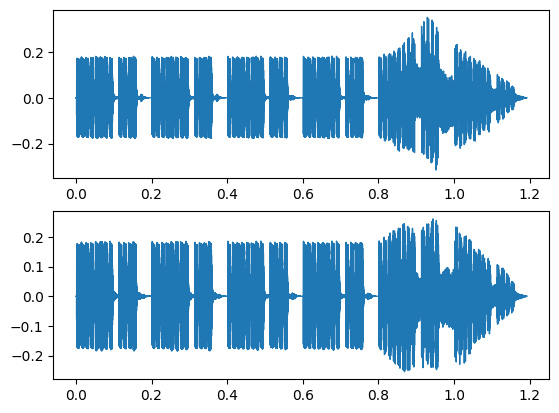

In [52]:
_plot(torch_audio, sample_rate=441100, title="Waveform")

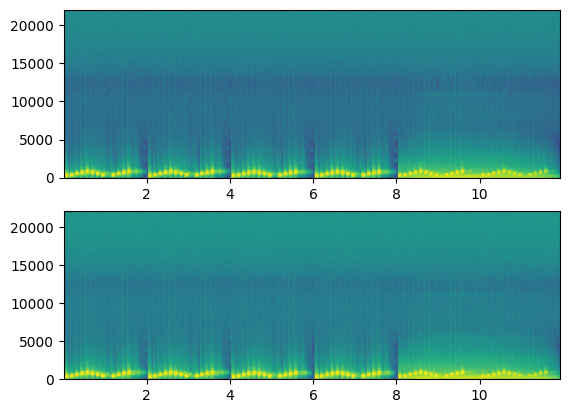

In [59]:
_plot(torch_audio, sample_rate=torch_sr, title=None)

# di lab bener gini pake komputer binus (di bawah)
# _plot(torch_audio, sample_rate=torch_sr, title=None)

# **Augmentation**

# **White Noise**

In [60]:
import numpy as np

# white noise
def white_noise(audio, factor):
    noise = np.random.normal(audio , audio.std(), audio.size)
    return audio + (noise * factor)

In [61]:
augment_white = white_noise(rosa_audio, 0.1)
display(Audio(augment_white, rate=rosa_sr))

# **Random Gain**

In [62]:
def random_gain(audio, min_gain, max_gain):
  gain = np.random.uniform(min_gain, max_gain)
  return audio * gain

In [63]:
augment_gain = random_gain(rosa_audio, 0, 5)
display(Audio(augment_gain, rate=rosa_sr))